# Final Project
## Group 38
### House of Representatives model


This notebook will open the parsed data and model past elections in order to predict the 2020 one.

The goal is to see if the demographics of a congressional district can be combined with polls to accurately predict the winner.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import math

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn.inspection import permutation_importance

In [2]:
data_dir = "data/"
input_files = ["final_data_h.csv"]
dfs = []
for i in input_files:
    df = pd.read_csv("%s%s" % (data_dir, i))
    dfs.append(df)
df = pd.concat(dfs, ignore_index=True)

display(df.head())
display(df.tail())
print(df.columns)
print(df.shape)


,year,state,district,dem,rep,tot,incumbent,prevparty,voteage_pop,voteage_m,...,"Age,35-49","Age,50-64","Age,65 and Older","Income,Less Than $50K","Income,$50-100K","Income,$100K or More","Race,White","Race,Non-White","Education,HS or less","Education,4yrDegree"
0,2012,AK,1,82927,185296,289804,1,r,260120,135526,...,0,-4,-11,20,-6,-14,-20,53,3,1
1,2012,AL,1,0,196374,200676,1,r,362092,175695,...,0,-4,-11,20,-6,-14,-20,76,3,0
2,2012,AL,2,103092,180591,283953,1,r,357776,173303,...,0,-4,-11,20,-6,-14,-20,77,3,0
3,2012,AL,3,98141,175306,273930,1,r,342806,167660,...,0,-4,-11,20,-6,-14,-20,77,3,1
4,2012,AL,4,69706,199071,269118,1,r,370119,180295,...,0,-4,-11,20,-6,-14,-20,64,3,1


,year,state,district,dem,rep,tot,incumbent,prevparty,voteage_pop,voteage_m,...,"Age,35-49","Age,50-64","Age,65 and Older","Income,Less Than $50K","Income,$50-100K","Income,$100K or More","Race,White","Race,Non-White","Education,HS or less","Education,4yrDegree"
2175,2020,WI,8,149558,268173,417731,1,r,560199,277228,...,9,-11,12,19,-7,12,-10,35,-3,0
2176,2020,WV,1,81177,180488,261665,1,r,482965,239085,...,9,-11,12,19,-7,12,-10,35,-3,0
2177,2020,WV,2,100799,172195,272994,1,r,485281,236771,...,9,-11,12,19,-7,12,-10,35,-3,0
2178,2020,WV,3,64927,161585,226512,1,r,452043,220564,...,9,-11,12,19,-7,12,-10,35,-3,0
2179,2020,WY,1,66576,185732,270367,1,r,434852,220281,...,9,-11,12,19,-7,12,-10,35,-3,0


Index(['year', 'state', 'district', 'dem', 'rep', 'tot', 'incumbent',
       'prevparty', 'voteage_pop', 'voteage_m', 'voteage_f', 'race_pop',
       'race_white', 'race_nonwhite', 'ed_pop', 'ed_4y', 'ed_no4y', 'age_pop',
       'age_18_34', 'age_35_49', 'age_50_64', 'age_65_plus', 'inc_pop',
       'inc_lt_50', 'inc_50_100', 'inc_100_plus', 'Gender,Male',
       'Gender,Female', 'Age,18-34', 'Age,35-49', 'Age,50-64',
       'Age,65 and Older', 'Income,Less Than $50K', 'Income,$50-100K',
       'Income,$100K or More', 'Race,White', 'Race,Non-White',
       'Education,HS or less', 'Education,4yrDegree'],
      dtype='object')
(2180, 39)


### Cleanup

Take the raw data, split into train and test, and fixup some columns.

In [3]:
# discard rows which do not have meaningful voting numbers
df = df[df['tot'] > 1]
df = df[df['prevparty'] != '']
print(df.shape)

# before splitting, add some columns based on others
df['demrepdiff'] = (df.dem - df.rep) / df.tot * 100
df['dem_win'] = (df['demrepdiff'] / df['demrepdiff'].abs() + 1) / 2
df['prevparty_d'] = (df.prevparty == 'd').astype(int)

# other desired columns
for c in ['voteage_m', 'voteage_f']:
    df[c + '_pct'] = df[c] / df.voteage_pop * 100
for c in ['race_white', 'race_nonwhite']:
    df[c + '_pct'] = df[c] / df.race_pop * 100
for c in ['ed_no4y', 'ed_4y']:
    df[c + '_pct'] = df[c] / df.ed_pop * 100
# for percentages, ignore under 18 age population
df['age_pop_18'] = df['age_18_34'] + df['age_35_49'] + df['age_50_64'] + df['age_65_plus']
for c in ['age_18_34', 'age_35_49', 'age_50_64', 'age_65_plus']:
    df[c + '_pct'] = df[c] / df.age_pop_18 * 100
for c in ['inc_lt_50', 'inc_50_100', 'inc_100_plus']:
    df[c + '_pct'] = df[c] / df.inc_pop * 100

arr_pcts = ['voteage_m', 'voteage_f',
            'age_18_34', 'age_35_49', 'age_50_64', 'age_65_plus',
            'inc_lt_50', 'inc_50_100', 'inc_100_plus',
            'race_white', 'race_nonwhite',
            'ed_no4y', 'ed_4y']
arr_prefs = ['Gender,Male',
             'Gender,Female', 'Age,18-34', 'Age,35-49', 'Age,50-64',
             'Age,65 and Older', 'Income,Less Than $50K', 'Income,$50-100K',
             'Income,$100K or More', 'Race,White', 'Race,Non-White',
             'Education,HS or less', 'Education,4yrDegree']
for (a,b) in zip(arr_pcts, arr_prefs):
    newf = a + "_delta"
    df[newf] = round(df[a] * df[b] / 100, -1)
    newf = a + "_deltapct"
    df[newf] = round(df[a + "_pct"] * df[b] / 100, -1)

display(df.head())
print(df.columns)
#r0 = df.iloc[0].values
#for i,c in enumerate(df.columns):
#    print(f'{c}: {r0[i]}')

(2149, 39)


,year,state,district,dem,rep,tot,incumbent,prevparty,voteage_pop,voteage_m,...,inc_100_plus_delta,inc_100_plus_deltapct,race_white_delta,race_white_deltapct,race_nonwhite_delta,race_nonwhite_deltapct,ed_no4y_delta,ed_no4y_deltapct,ed_4y_delta,ed_4y_deltapct
0,2012,AK,1,82927,185296,289804,1,r,260120,135526,...,-10750.0,-0.0,-97310.0,-10.0,129800.0,20.0,10030.0,0.0,1300.0,0.0
1,2012,AL,1,0,196374,200676,1,r,362092,175695,...,-5290.0,-0.0,-94020.0,-10.0,169500.0,20.0,10850.0,0.0,0.0,0.0
2,2012,AL,2,103092,180591,283953,1,r,357776,173303,...,-5100.0,-0.0,-90240.0,-10.0,178940.0,30.0,10750.0,0.0,0.0,0.0
3,2012,AL,3,98141,175306,273930,1,r,342806,167660,...,-4890.0,-0.0,-97890.0,-10.0,159250.0,20.0,10880.0,0.0,920.0,0.0
4,2012,AL,4,69706,199071,269118,1,r,370119,180295,...,-3900.0,-0.0,-119790.0,-20.0,52490.0,10.0,11720.0,0.0,700.0,0.0


Index(['year', 'state', 'district', 'dem', 'rep', 'tot', 'incumbent',
       'prevparty', 'voteage_pop', 'voteage_m', 'voteage_f', 'race_pop',
       'race_white', 'race_nonwhite', 'ed_pop', 'ed_4y', 'ed_no4y', 'age_pop',
       'age_18_34', 'age_35_49', 'age_50_64', 'age_65_plus', 'inc_pop',
       'inc_lt_50', 'inc_50_100', 'inc_100_plus', 'Gender,Male',
       'Gender,Female', 'Age,18-34', 'Age,35-49', 'Age,50-64',
       'Age,65 and Older', 'Income,Less Than $50K', 'Income,$50-100K',
       'Income,$100K or More', 'Race,White', 'Race,Non-White',
       'Education,HS or less', 'Education,4yrDegree', 'demrepdiff', 'dem_win',
       'prevparty_d', 'voteage_m_pct', 'voteage_f_pct', 'race_white_pct',
       'race_nonwhite_pct', 'ed_no4y_pct', 'ed_4y_pct', 'age_pop_18',
       'age_18_34_pct', 'age_35_49_pct', 'age_50_64_pct', 'age_65_plus_pct',
       'inc_lt_50_pct', 'inc_50_100_pct', 'inc_100_plus_pct',
       'voteage_m_delta', 'voteage_m_deltapct', 'voteage_f_delta',
       'voteage

In [4]:
# split into test and train, then into x and y
df_mod = df.drop(columns=['year', 'state', 'district', 'dem', 'rep', 'tot', 'prevparty'])
df_train = df_mod.loc[df.year != 2020]
df_test = df_mod.loc[df.year == 2020]
X_train = df_train.drop(columns=['demrepdiff', 'dem_win'])
y_train = df_train['dem_win']
X_test = df_test.drop(columns=['demrepdiff', 'dem_win'])
y_test = df_test['dem_win']

print(f"Train {X_train.shape} {y_train.shape}")
print(f"Test {X_test.shape} {y_test.shape}")


Train (1727, 73) (1727,)
Test (422, 73) (422,)


### Show attribute relationships

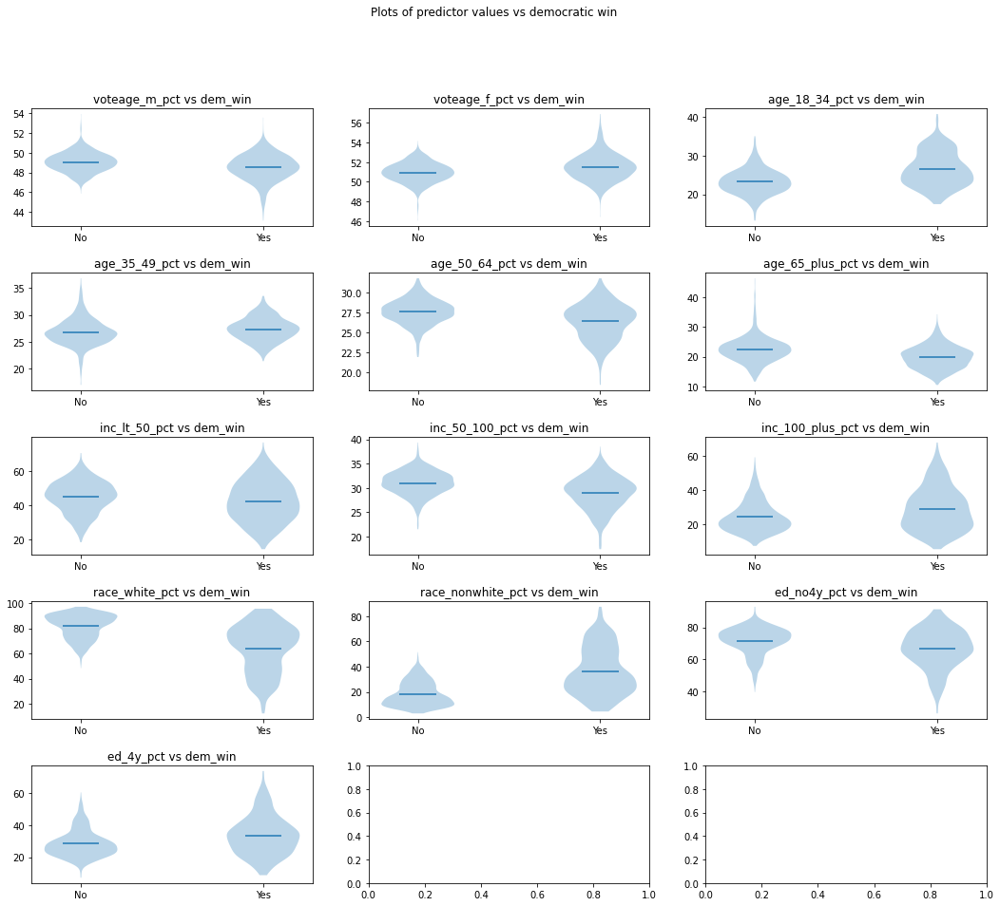

In [5]:
predsA = [x + "_pct" for x in arr_pcts]

#preds = ['voteage_m_pct', 'voteage_f_pct',
#         'race_white_pct', 'race_black_pct', 'race_asian_pct', 'race_hisp_pct']

#print(df[['voteage_m_pct', 'dem_win']][100:150])

# create a plot for given axes
# args: ax = ax graphing object, n = index of graph, p = predictor name, y = response name,
#       X = data frame with p and y
def plot_violin(ax, n, p, y, X):
    X0 = X.loc[X[y] == False]
    X1 = X.loc[X[y] == True]
    ax[n].violinplot([X0[p].values, X1[p].values], [False,True],
                     widths=0.4, showmeans=True, showextrema=False, showmedians=False);
    ax[n].set_xticks([0.0, 1.0])
    ax[n].set_xticklabels(['No', 'Yes'])
    ax[n].set_title(f'{p} vs {y}')
    return

ncol = 3
nrow = math.ceil(len(arr_pcts)/ncol)
fig, ax = plt.subplots(nrow,ncol, figsize = (18,15))
ax = ax.ravel()
for n, p in enumerate(predsA):
    plot_violin(ax, n, p, 'dem_win', df)

fig.suptitle('Plots of predictor values vs democratic win')
fig.subplots_adjust(hspace=0.4)
plt.show()


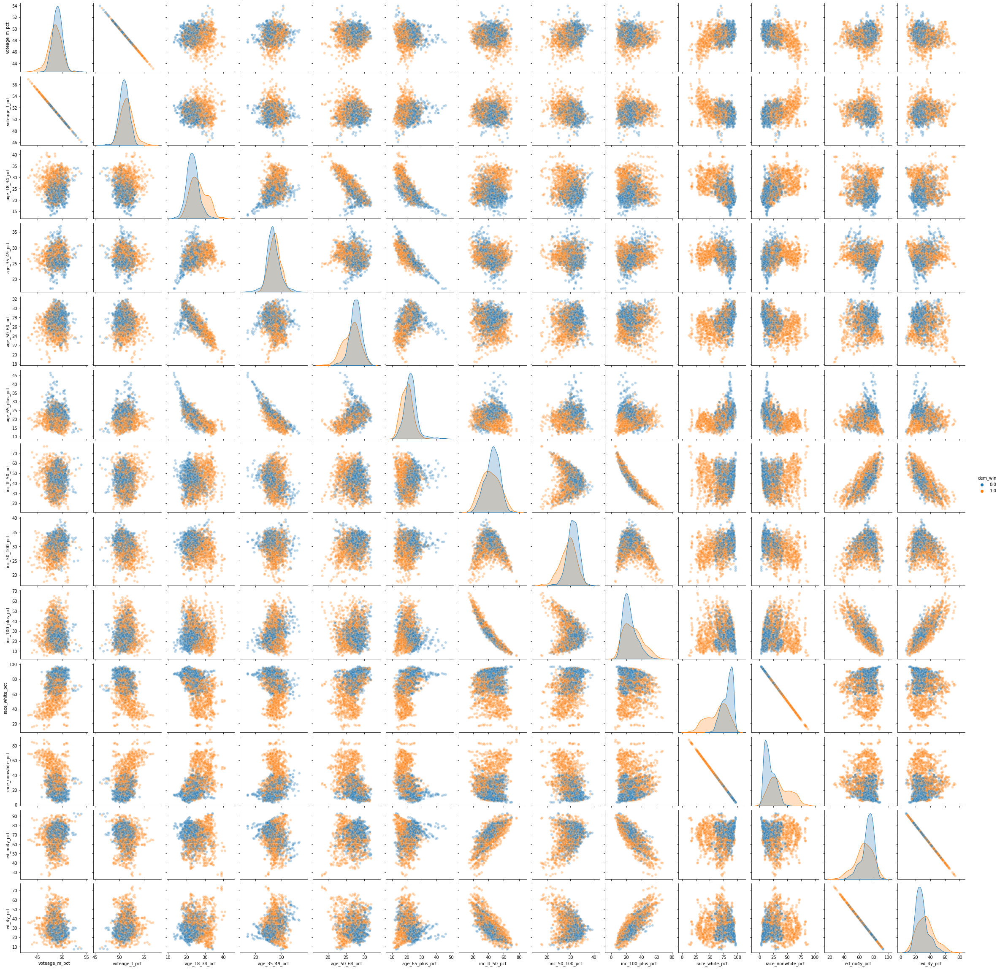

In [6]:

sns.pairplot(df, vars=predsA, hue='dem_win',
             plot_kws=dict(alpha=0.3))


### Add in polling numbers

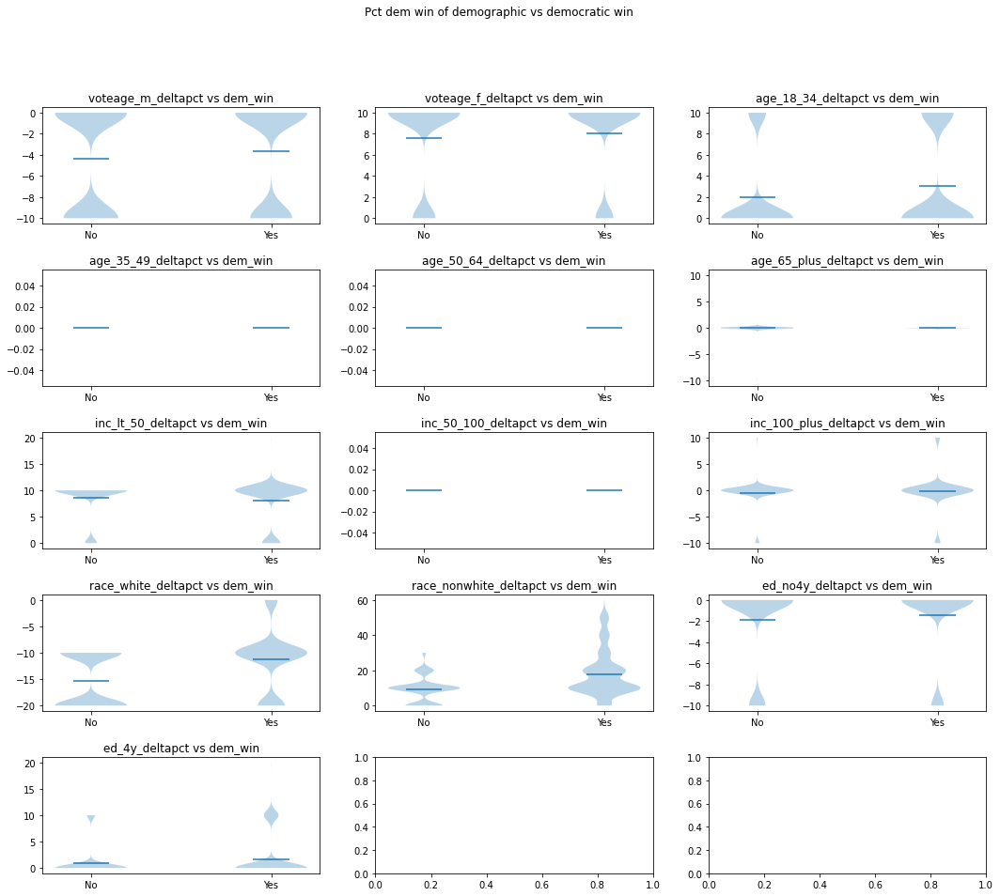

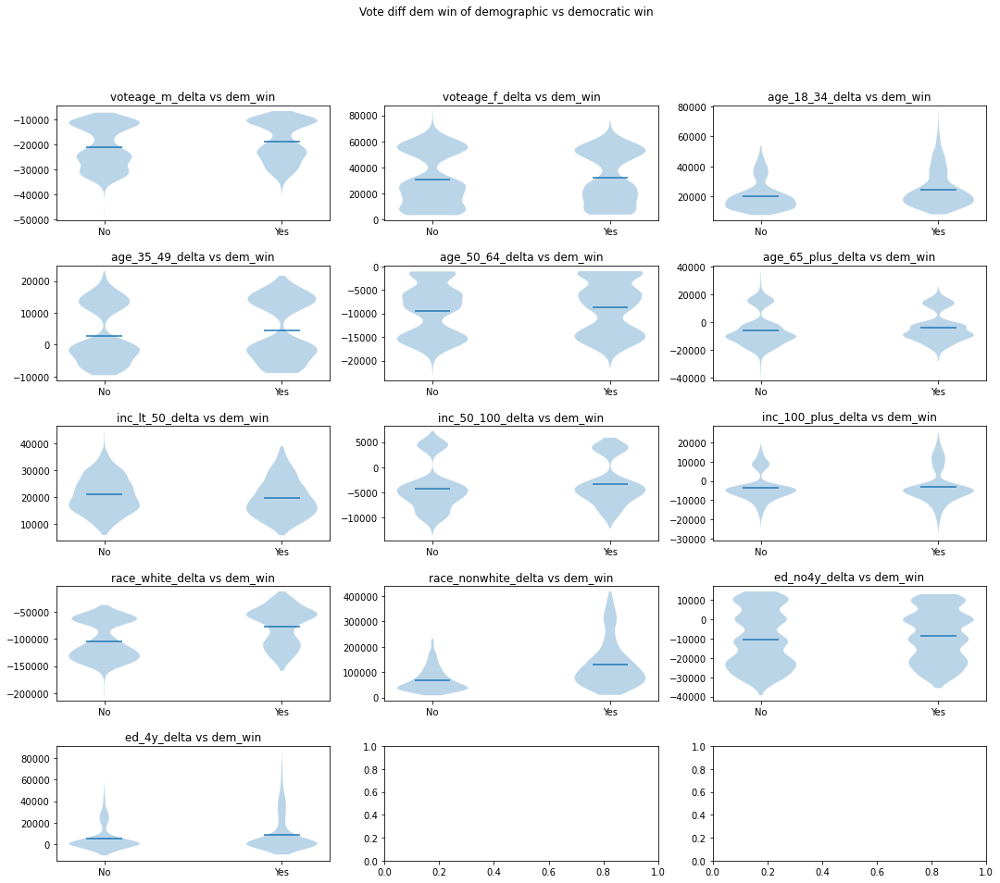

In [7]:
predsB = [x + "_deltapct" for x in arr_pcts]
predsC = [x + "_delta" for x in arr_pcts]

ncol = 3
nrow = math.ceil(len(arr_pcts)/ncol)
fig, ax = plt.subplots(nrow,ncol, figsize = (18,15))
ax = ax.ravel()
for n, p in enumerate(predsB):
    plot_violin(ax, n, p, 'dem_win', df)

fig.suptitle('Pct dem win of demographic vs democratic win')
fig.subplots_adjust(hspace=0.4)
plt.show()

fig, ax = plt.subplots(nrow,ncol, figsize = (18,15))
ax = ax.ravel()
for n, p in enumerate(predsC):
    plot_violin(ax, n, p, 'dem_win', df)

fig.suptitle('Vote diff dem win of demographic vs democratic win')
fig.subplots_adjust(hspace=0.4)
plt.show()


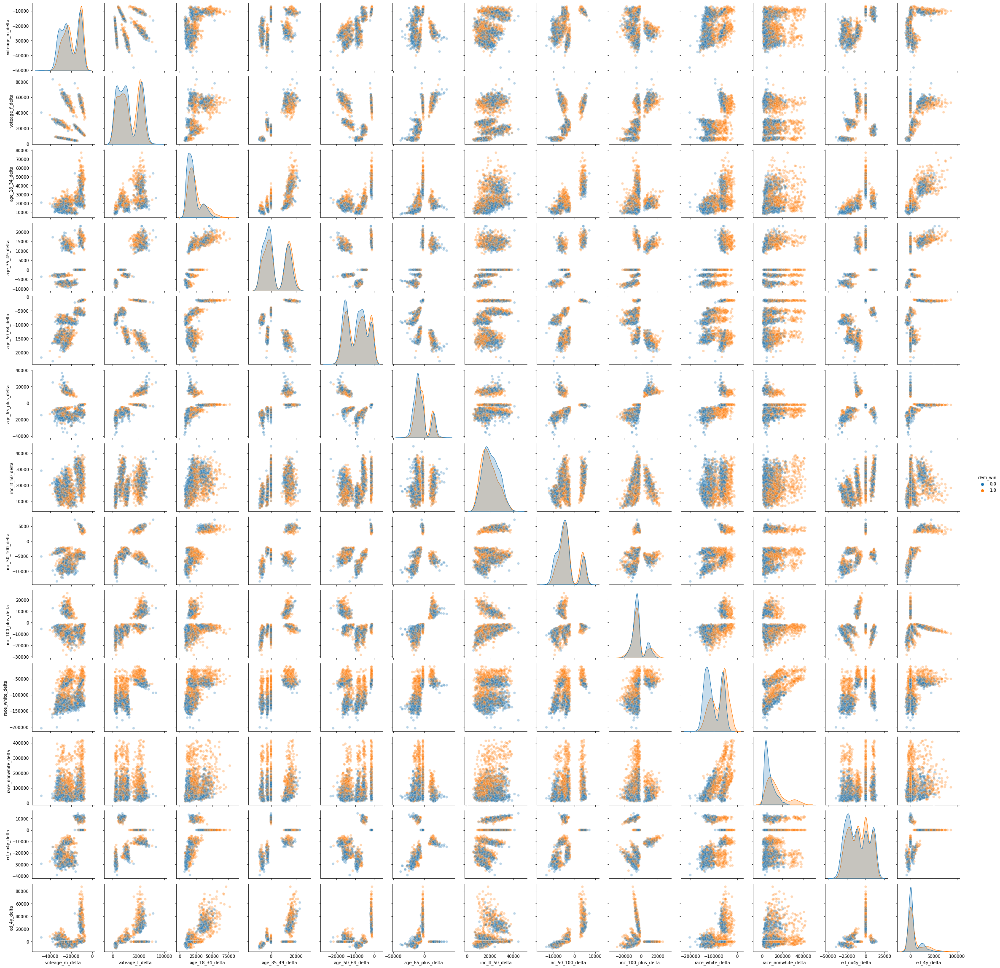

In [8]:
#sns.pairplot(df, vars=predsB, hue='dem_win',
#             plot_kws=dict(alpha=0.3))
sns.pairplot(df, vars=predsC, hue='dem_win',
             plot_kws=dict(alpha=0.3))

In [9]:
preds3 = predsA + predsB + predsC
#print(preds3)


In [10]:
notworking = """

fig, ax = plt.subplots(5,3, figsize = (18,10))
ax = ax.ravel()
for i in range(len(preds3)):
    sns.kdeplot(df[preds3[i]], df['dem_win'], ax=ax[i])
    #ax[i].set_yticks([0.0, 1.0])
    #ax[i].set_yticklabels(['Rep', 'Dem'])
    break
fig.subplots_adjust(hspace=0.4)
fig.suptitle('Plots of feature histograms of winning party')
plt.show()
"""

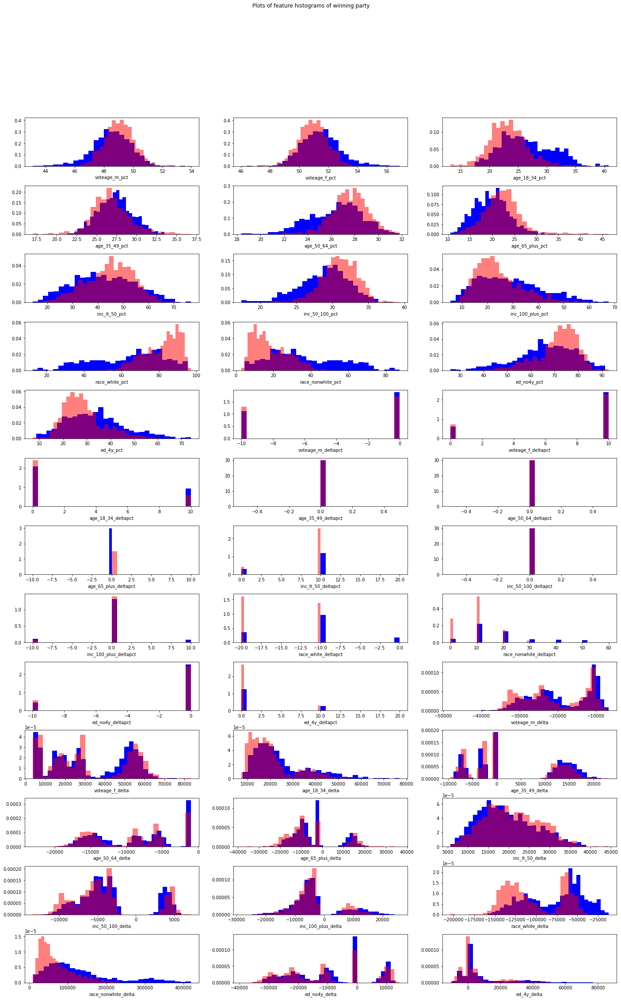

In [11]:
ncol = 3
nrow = math.ceil(len(preds3)/ncol)
fig, ax = plt.subplots(nrow,ncol, figsize = (24,36))
ax = ax.ravel()
for i in range(len(preds3)):
    ax[i].hist(df.loc[df['dem_win'] == 1][preds3[i]], 30, density=True, color='blue')
    ax[i].hist(df.loc[df['dem_win'] != 1][preds3[i]], 30, density=True, color='red', alpha=0.5)
    ax[i].set_xlabel(preds3[i])
    #break
fig.subplots_adjust(hspace=0.4)
fig.suptitle('Plots of feature histograms of winning party')
plt.show()


### By magnitude of win (vote difference)

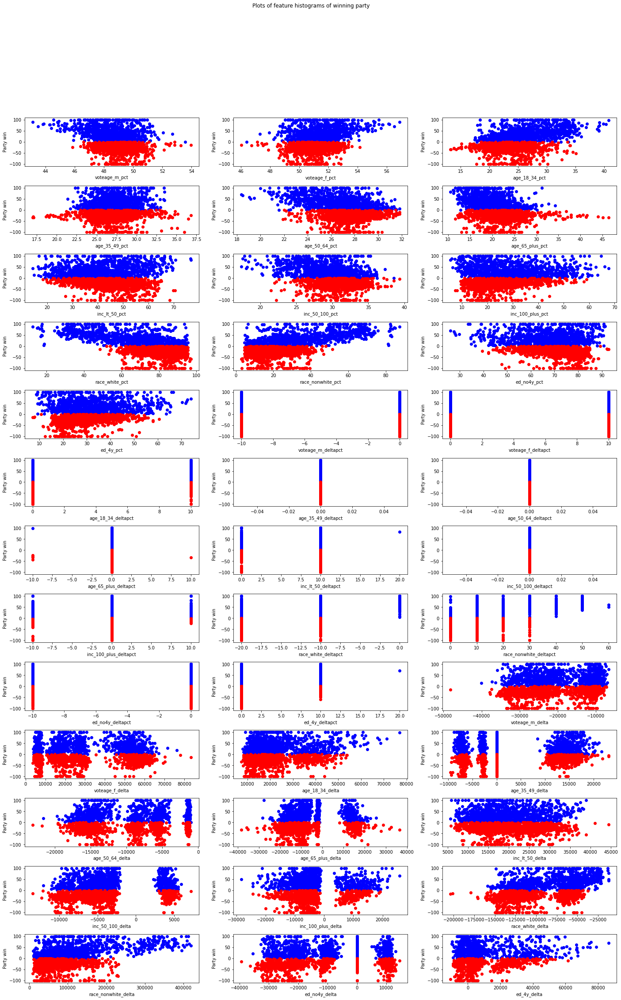

In [12]:
ncol = 3
nrow = math.ceil(len(preds3)/ncol)
fig, ax = plt.subplots(nrow,ncol, figsize = (24,36))
ax = ax.ravel()
dfD = df.loc[df['dem_win'] == 1]
dfR = df.loc[df['dem_win'] != 1]

for i in range(len(preds3)):
    ax[i].scatter(dfD[preds3[i]], dfD['demrepdiff'], color='blue')
    ax[i].scatter(dfR[preds3[i]], dfR['demrepdiff'], color='red')
    #ax[i].hist(df.loc[df['dem_win'] != 1][preds3[i]], 30, density=True, color='red', alpha=0.5)
    ax[i].set_xlabel(preds3[i])
    ax[i].set_ylabel('Party win')
    #break
fig.subplots_adjust(hspace=0.4)
fig.suptitle('Plots of feature histograms of winning party')
plt.show()


### Model

In [13]:
random_state = 12345

max_depth = 10
n_estimators = 12
random_forest = RandomForestClassifier(random_state=random_state, max_depth=max_depth,
                                       n_estimators=n_estimators)

# Fit the model on the training set
random_forest.fit(X_train.values, y_train.values)

random_forest_result = permutation_importance(random_forest, X_train, y_train, random_state=random_state)

# We make predictions on the validation set 
y_train_pred = random_forest.predict(X_train)
y_test_pred = random_forest.predict(X_test)

acc_train = accuracy_score(y_train, y_train_pred)
print(f"{i}")
print(f"Train accuracy = {acc_train:0.4f}")
acc_test = accuracy_score(y_test, y_test_pred)
print(f"Test accuracy = {acc_test:0.4f}")




38
Train accuracy = 0.9925
Test accuracy = 0.9455


In [14]:
y_train.describe()

count    1727.000000
mean        0.471917
std         0.499355
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: dem_win, dtype: float64

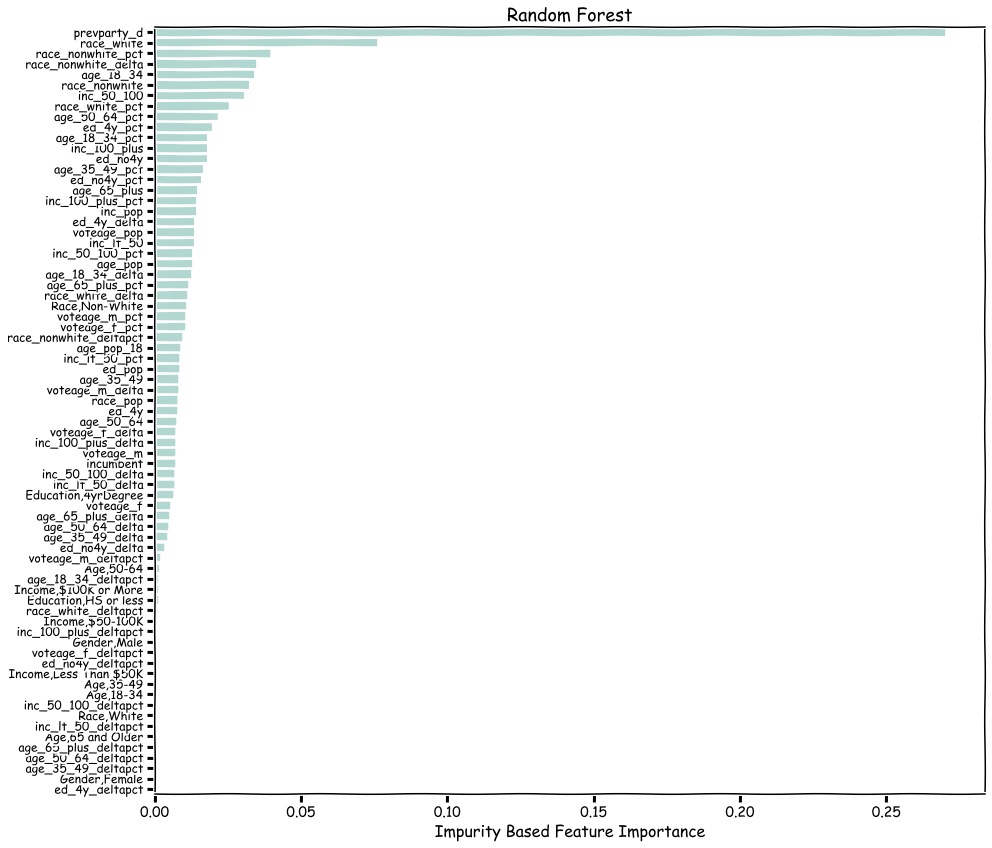

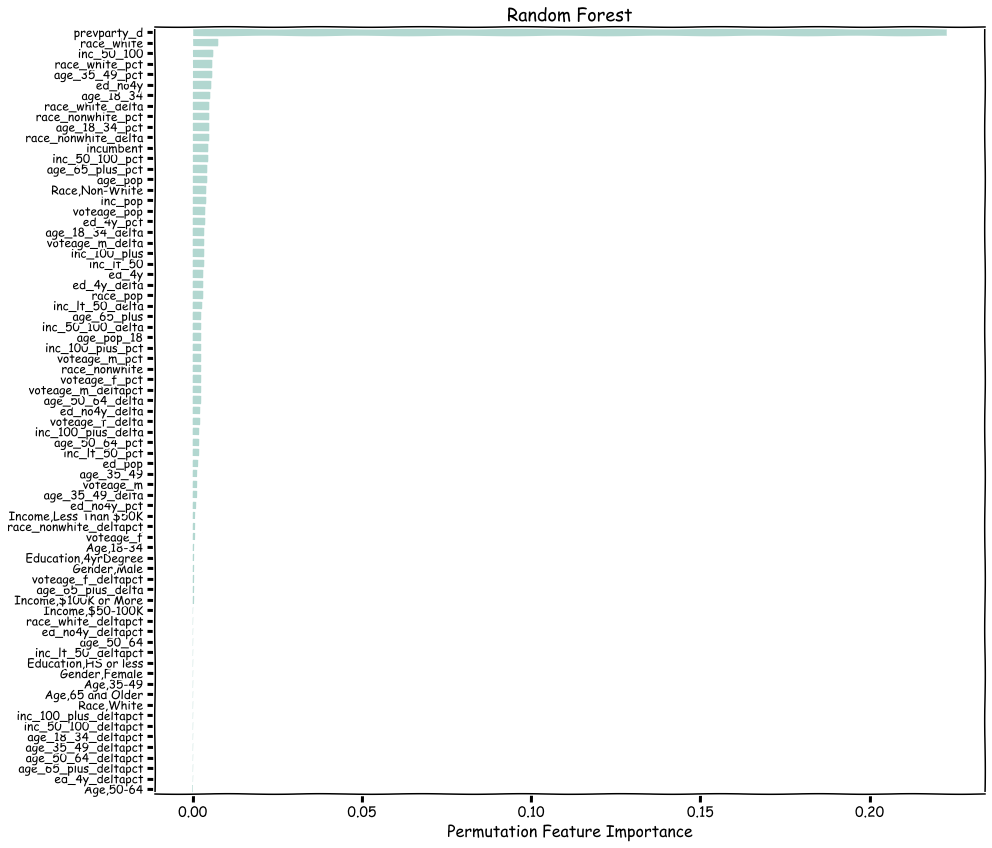

In [15]:
# From CS109A Lecture 25 helper.py (with slight modifications)

# Helper function to plot the impurity-based feature importances of the defined 
def plot_feature_importance(model1,X,y):
    
    plt.xkcd(scale=0.3,randomness=0.6)
#     maxlim = max(max(model1.feature_importances_),max(model2.feature_importances_))
    fig, (ax1) = plt.subplots(1, 1, figsize=(14, 12))

    # Plot for Random Forest
    tree_importance_sorted_idx = np.argsort(model1.feature_importances_)
    tree_indices = np.arange(0, len(model1.feature_importances_)) + 0.5

    ax1.barh(tree_indices, 
           model1.feature_importances_[tree_importance_sorted_idx], 
           height=0.7, color='#B2D7D0')
    ax1.set_yticks(tree_indices)
    ax1.set_yticklabels(X.columns[tree_importance_sorted_idx], 
                        fontsize=12)
    ax1.set_ylim((0, len(model1.feature_importances_)))
#     ax1.set_xlim((0, maxlim+0.01))
    ax1.set_xlabel("Impurity Based Feature Importance", fontsize=16)
    
    #ax1.set_ylabel("Predictors", fontsize=16)
    ax1.set_title("Random Forest", fontsize=18)
    fig.tight_layout()
    plt.show()


# Helper function to plot the feature importance for the defined model
def plot_permute_importance(result1,X,y):
#     maxlim = max(max(result1.importances_mean),max(result2.importances_mean))
    plt.xkcd(scale=0.3,randomness=0.6)
    # Plot for random forest
    fig, (ax1) = plt.subplots(1, 1, figsize=(14, 12))

    tree_importance_sorted_idx = np.argsort(result1.importances_mean)
    tree_indices = np.arange(0, len(result1.importances_mean)) +0.5

    ax1.barh(tree_indices, result1.importances_mean[tree_importance_sorted_idx], 
              height=0.7, color='#B2D7D0')
    ax1.set_yticks(tree_indices)
    ax1.set_yticklabels(X.columns[tree_importance_sorted_idx], fontsize=12)
    ax1.set_ylim((0, len(result1.importances_mean)))
    ax1.set_xlabel("Permutation Feature Importance", fontsize=16)

    #ax1.set_ylabel("Predictors", fontsize=16)
    ax1.set_title("Random Forest", fontsize=18)
    fig.tight_layout()
    plt.show()


# 
plot_feature_importance(random_forest, X_train, y_train);
plot_permute_importance(random_forest_result, X_train, y_train);


### Remove previous party column

"Previous party" is a little too good - most seats are kept by the same party. Try to model it without that predictor.

In [16]:
# what if we just used the previous party as the prediction
acc_train = accuracy_score(y_train, X_train['prevparty_d'])
print(f"Train accuracy = {acc_train:0.4f}")
acc_test = accuracy_score(y_test, X_test['prevparty_d'])
print(f"Test accuracy = {acc_test:0.4f}")


Train accuracy = 0.9091
Test accuracy = 0.9597


Without Previous Party predictor:
Train accuracy = 0.9566
Test accuracy = 0.8246


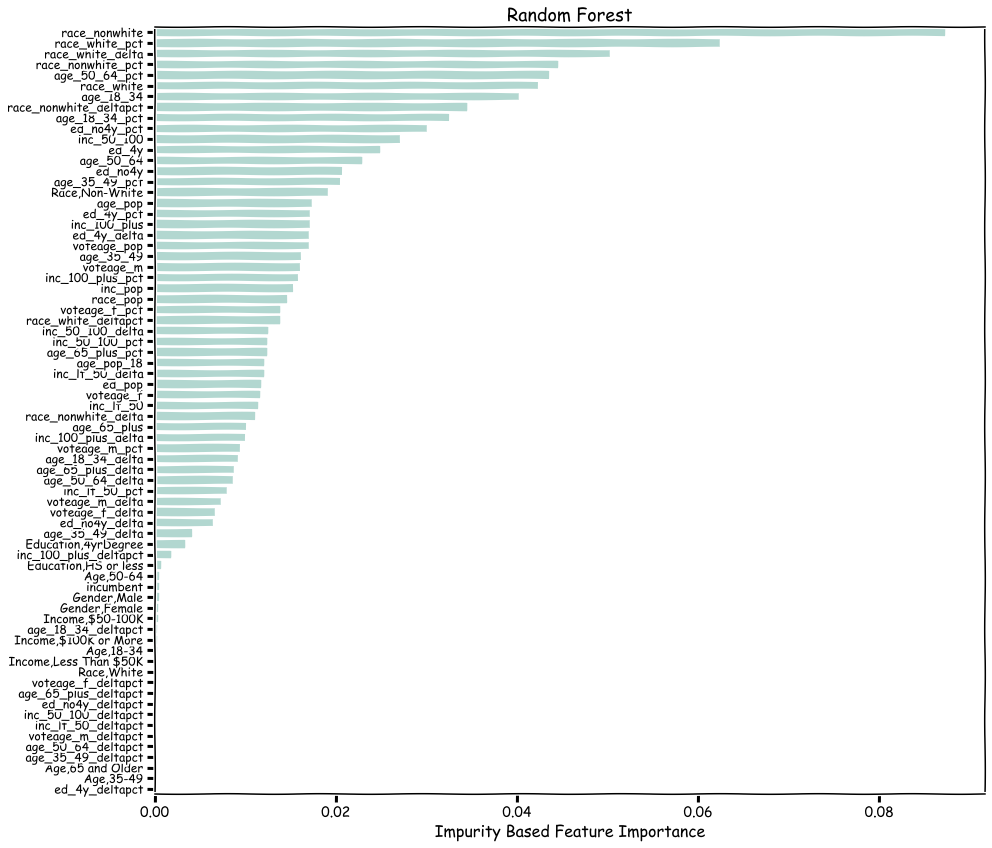

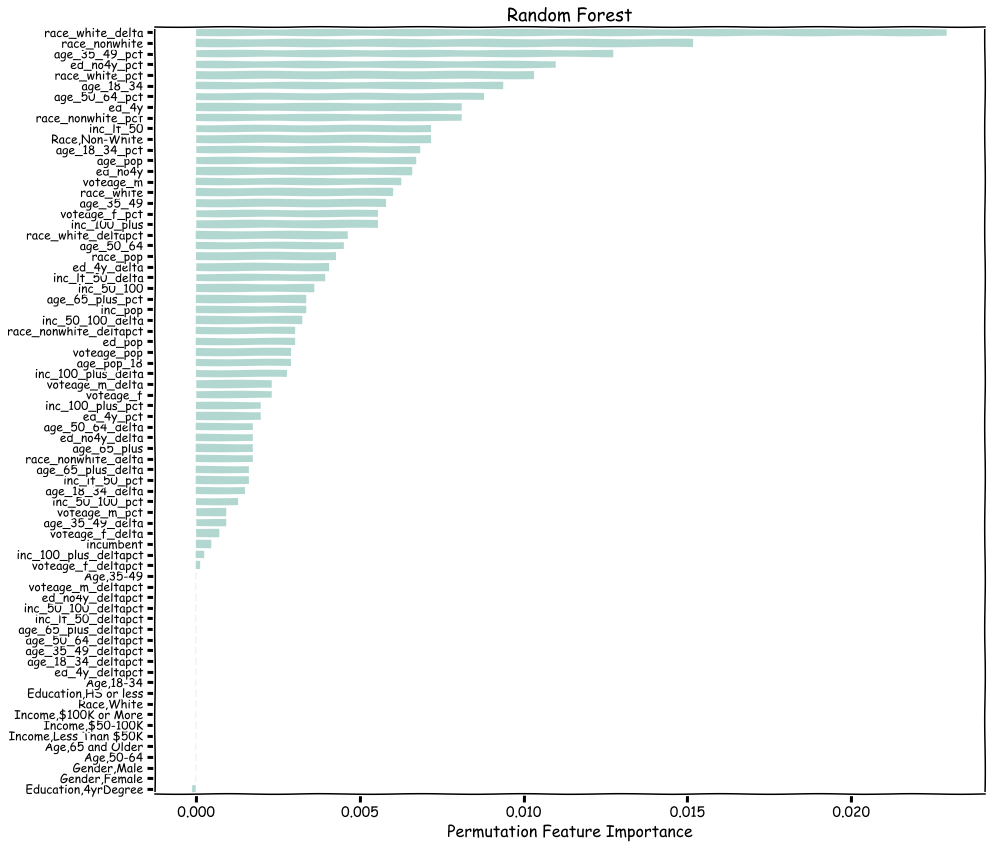

In [17]:
X_train2 = X_train.drop(columns=['prevparty_d'])
X_test2 = X_test.drop(columns=['prevparty_d'])

random_forest2 = RandomForestClassifier(random_state=random_state, max_depth=max_depth,
                                        n_estimators=n_estimators)

# Fit the model on the training set
random_forest2.fit(X_train2.values, y_train.values)

random_forest2_result = permutation_importance(random_forest2, X_train2, y_train, random_state=random_state)

# We make predictions on the validation set 
y_train2_pred = random_forest2.predict(X_train2)
y_test2_pred = random_forest2.predict(X_test2)

print("Without Previous Party predictor:")
acc_train2 = accuracy_score(y_train, y_train2_pred)
print(f"Train accuracy = {acc_train2:0.4f}")
acc_test2 = accuracy_score(y_test, y_test2_pred)
print(f"Test accuracy = {acc_test2:0.4f}")

plot_feature_importance(random_forest2, X_train2, y_train);
plot_permute_importance(random_forest2_result, X_train2, y_train);


Without Previous Party predictor:
Train accuracy = 0.7933
Test accuracy = 0.7678


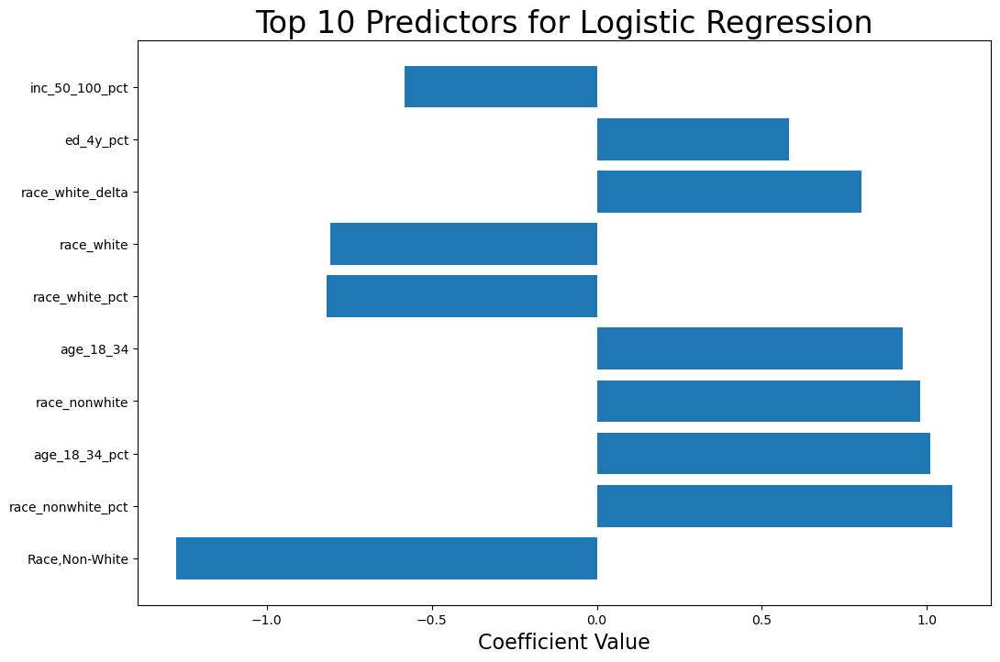

In [66]:
# Logistic Regression
from sklearn.linear_model import LogisticRegression

plt.style.use('default')

scale = np.where(X_train2.max() == X_train2.min(), 1, X_train2.max() - X_train2.min())

X_train_scaled = (X_train2 - X_train2.min()) / scale
X_test_scaled = (X_test2 - X_train2.min()) / scale

model3 = LogisticRegression(fit_intercept=False, max_iter=1000, C=0.1).fit(X_train_scaled.values, y_train.values)

# We make predictions on the validation set 
y_train3_pred = model3.predict(X_train_scaled)
y_test3_pred = model3.predict(X_test_scaled)

print("Without Previous Party predictor:")
acc_train3 = accuracy_score(y_train, y_train3_pred)
print(f"Train accuracy = {acc_train3:0.4f}")
acc_test3 = accuracy_score(y_test, y_test3_pred)
print(f"Test accuracy = {acc_test3:0.4f}")

predictors = sorted(list(zip(X_train2.columns, np.ravel(model3.coef_))), reverse=True, key=lambda x : abs(x[1]))[:10]

fig, ax = plt.subplots(figsize=(12, 8))
ax.set_title("Top 10 Predictors for Logistic Regression", fontsize=24)
ax.set_xlabel("Coefficient Value", fontsize=16)
ax.barh([x[0] for x in predictors], [y[1] for y in predictors])
plt.show()

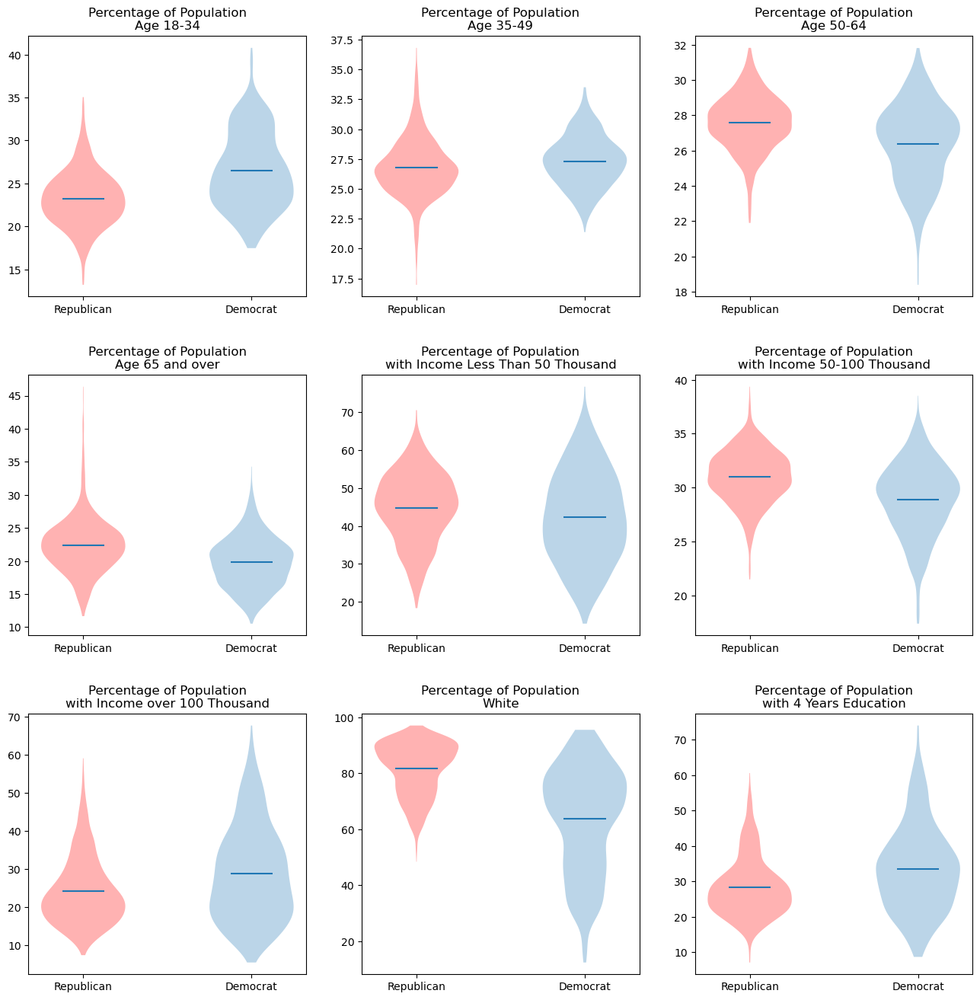

In [94]:
fig, axs = plt.subplots(3, 3, figsize=(16,16))

X_dem = df.loc[df['dem_win'] == True]
X_rep = df.loc[df['dem_win'] == False]
preds = [
    ('age_18_34_pct', "Age 18-34"),
    ('age_35_49_pct', "Age 35-49"),
    ('age_50_64_pct', "Age 50-64"),
    ('age_65_plus_pct', "Age 65 and over"),
    ('inc_lt_50_pct', "with Income Less Than 50 Thousand"),
    ('inc_50_100_pct', "with Income 50-100 Thousand"),
    ('inc_100_plus_pct', "with Income over 100 Thousand"),
    ('race_white_pct', "White"),
    ('ed_4y_pct', "with 4 Years Education")]

for ax, pred in zip(np.ravel(axs), preds):
    ax.set_title(f"Percentage of Population\n{pred[1]}", fontsize=12)
    parts = ax.violinplot([X_rep[pred[0]], X_dem[pred[0]]], [False, True], showmeans=True, showextrema=False)
    parts['bodies'][0].set_facecolor('r')
    ax.set_xticks([0, 1])
    ax.set_xticklabels(['Republican', 'Democrat'])
fig.subplots_adjust(hspace=0.3)
plt.show()